# Exploaity Data Analysis - EDA

## Import libraries

In [12]:
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
#map
import folium  

# clustring

from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import KMeans # K-Means clustering algorithm
from yellowbrick.cluster import KElbowVisualizer

## Load data

In [2]:
df = pd.read_csv('Data/final_data.csv')

In [3]:
df_boroughs = pd.read_csv("Data/London_cleaned_data.csv")

In [4]:
london_geojson = json.load(open("Data/london_boroughs.json", "r"))


In [5]:
df.head()

,Borough,Neighborhood Latitude,Neighborhood Longitude,Name,Restaurant Latitude,Restaurant Longitude,Category_Names,Area (sq mi),Population_2019,Density,Median_Househols_Income,N_employees
0,Barking and Dagenham,51.5607,0.1557,Lara Grill,51.562533,0.147262,Fast Food Restaurant,13.93,212906,5.871,21.953,57.715
1,Barking and Dagenham,51.5607,0.1557,The Beacon Tree,51.561391,0.140883,Pub,13.93,212906,5.871,21.953,57.715
2,Barking and Dagenham,51.5607,0.1557,Domino's Pizza,51.572111,0.137844,Pizzeria,13.93,212906,5.871,21.953,57.715
3,Barking and Dagenham,51.5607,0.1557,Subway,51.568813,0.178686,Fast Food Restaurant,13.93,212906,5.871,21.953,57.715
4,Barking and Dagenham,51.5607,0.1557,Millennium Cafe,51.562272,0.147468,Café,13.93,212906,5.871,21.953,57.715


In [6]:
df.describe()

,Neighborhood Latitude,Neighborhood Longitude,Restaurant Latitude,Restaurant Longitude,Area (sq mi),Population_2019,Density,Median_Househols_Income,N_employees
count,1692.000000,1692.000000,1680.000000,1680.000000,1692.000000,1692.000000,1692.000000,1692.000000,1692.000000
mean,51.505902,0.120164,51.504475,0.116608,18.361820,287505.325059,8.363492,30.802820,159.866711
std,0.064386,0.092763,0.064584,0.093203,12.681051,49977.777859,4.250227,4.672001,140.184205
min,51.361800,0.005900,51.356300,-0.022256,4.680000,156129.000000,2.205000,21.953000,57.715000
25%,51.456700,0.055300,51.457423,0.050976,9.870000,259552.000000,4.709000,28.043000,79.985000
50%,51.503500,0.102200,51.503470,0.097736,13.980000,287942.000000,7.652000,29.549000,114.010000
75%,51.558800,0.155700,51.552285,0.164642,21.780000,326034.000000,11.883000,33.659000,153.450000
max,51.653800,0.476000,51.660797,0.487954,57.970000,395896.000000,16.097000,43.315000,754.650000


<b>Observation:</b>

- The average area for each borough is 18.3 mi&#178;, whereas, the maximum area is 57.9 mi&#178;.
- The average number of population is 287505.32, whereas, the maximum populated area has 395896.00.
- The average density is 8.36, whereas, the maximum pdensity is around 16. 
- The range of the median household income in the London is between £21.953 and £43.315, based on estimates from the Office for National Statistics (ONS) Household Finances Survey. 
- There is a huge different between the number of employees based on their workplace location from the Business register and employment survey (BRES).



## Check for null values

In [7]:
df.isna().sum()


Borough                     0
Neighborhood Latitude       0
Neighborhood Longitude      0
Name                        0
Restaurant Latitude        12
Restaurant Longitude       12
Category_Names              0
Area (sq mi)                0
Population_2019             0
Density                     0
Median_Househols_Income     0
N_employees                 0
dtype: int64

 There are 12 restaurants do not have the latitude longitude information.  

## Check for duplicated values

In [8]:
len(df[df.duplicated()])


0

In [9]:
df.shape

(1692, 12)

# Visualising and Understanding the Data

## London Population Map

In [14]:
# create choropleth map of the London population 
map_lon = folium.Map(location=[51.50, 0.11], # London coordinates
                  mapbox_style="carto-positron",
                  zoom_start=10)

map1 =folium.Choropleth(
            geo_data=london_geojson, # map data
            data=df_boroughs, # dataframe
            columns=['Borough','Population_2019'], # used columns
            fill_color='YlGnBu',
            fill_opacity = 0.7,
            key_on='feature.properties.name',#geojson borough name
            legend_name='Population'
                        ).add_to(map_lon)

  #style the tooltip box
map1.geojson.add_child(
    folium.features.GeoJsonTooltip(fields= ['name'],
                                   aliases=['Borough:'],
                                   labels=True,
                                   localize=True,
                                   sticky=False,
                                   style="""
                                   background-color: #F0EFEF;
                                   border: 2px solid black;
                                   border-radius: 3px;
                                   box-shadow: 3px;
                                   """,)
)
map_lon

## London Density Map 

In [15]:
# create choropleth map of the London density 
map_lon = folium.Map(location=[51.50, 0.11], # London coordinates
                  mapbox_style="carto-positron",
                  zoom_start=10)



map2 =folium.Choropleth(
            geo_data=london_geojson, # map data
            data=df_boroughs, # dataframe
            columns=['Borough','Density'], # used columns
            fill_color='YlGnBu',
            fill_opacity = 0.7,
            opacity=0.9,
            key_on='feature.properties.name',#geojson borough name
            legend_name='Density (per km2)'
                        ).add_to(map_lon)


    
  #style the tooltip box
map2.geojson.add_child(
    folium.features.GeoJsonTooltip(fields= ['name'],
                                   aliases=['Borough:'],
                                   labels=True,
                                   localize=True,
                                   sticky=False,
                                   style="""
                                   background-color: #F0EFEF;
                                   border: 2px solid black;
                                   border-radius: 3px;
                                   box-shadow: 3px;
                                   """,))
map_lon

## Top 10 Boroughs based on the Median Househols Income

In [16]:
# create a bar chart to present the top 10 Borouhs based on the Median Househols Income


fig = px.bar(df_boroughs.sort_values('Median_Househols_Income', ascending=False).head(10), x='Borough' , y='Median_Househols_Income')
fig.update_layout( xaxis={'categoryorder':'total descending'})
fig.update_layout(title_text='Median Household Income for London Boroughs- 2019')
fig.show()

## Top 10 Borouhs based on the Numper of employees

In [18]:
# create a bar chart to present the top 10 Borouhs based on the number of employees


fig2 = px.bar(df_boroughs.sort_values('N_employees', ascending=False).head(10), x='Borough' , y='N_employees')
fig2.update_layout( xaxis={'categoryorder':'total descending'})
fig2.update_layout(title_text='Number of Employee in London ')
fig2.show()

In [20]:
print('Top ten neighborhoods in total restaurant are:\n ', df.Borough.value_counts().head(10))

Top ten neighborhoods in total restaurant are:
  Hackney           88
Redbridge         86
Lambeth           83
Newham            82
Waltham Forest    82
Greenwich         81
Bexley            81
Havering          80
Southwark         78
Tower Hamlets     77
Name: Borough, dtype: int64


## Top 10 Borouhs based on the Density

In [31]:
## create a bar chart to present the top 10 Borouhs based on the Density


fig3 = px.bar(df_boroughs.sort_values('Density', ascending=False).head(10), x='Borough' , y='Density')
fig3.update_layout( xaxis={'categoryorder':'total descending'})
a = ('Density km**2 of London Boroughs(2019)')
fig3.update_layout(title_text= a )
fig3.show()

> <b> Note:</b> Population size is the number of individuals in a population. Whereas, population density is the average number of individuals per unit of area.

In [58]:
## create a bar chart to present the top 10 Borouhs based on the Population


fig4 = px.bar(df_boroughs.sort_values('Population_2019', ascending=False).head(10), x='Borough' , y='Density')
fig4.update_layout( xaxis={'categoryorder':'total descending'})
a = ('Population of London Boroughs (2019)')
fig4.update_layout(title_text= a )
fig4.show()

In [32]:
# Let's see the most common types of cuisine we have in our results
df.groupby('Category_Names').count()[['Name']].sort_values(by=['Name'], ascending=False).head()



,Name
Category_Names,
Fast Food Restaurant,266
Café,208
Restaurant,143
Indian Restaurant,122
Chinese Restaurant,100


## Restaurant Categories 

In [33]:
unique_cat = df.Category_Names.nunique()

In [34]:
print('There are', unique_cat, 'unique categories')

There are 101 unique categories


In [35]:
len(df.Category_Names.unique())

101

In [36]:
# to expand the cell
pd.set_option('display.max_rows', None)

### How many restaurants are there for each category?



In [37]:
# how many restaurants are there for each category?
df.Category_Names.value_counts()

Fast Food Restaurant              266
Café                              208
Restaurant                        143
Indian Restaurant                 122
Chinese Restaurant                100
Fish and Chips Shop                94
Pizzeria                           76
Bakery                             59
Pub                                55
Italian Restaurant                 52
Bar                                44
Cafes, Coffee, and Tea Houses      34
Coffee Shop                        30
Turkish Restaurant                 30
Burger Joint                       28
Asian Restaurant                   26
English Restaurant                 20
American Restaurant                20
African Restaurant                 15
Greek Restaurant                   11
Fried Chicken Joint                11
Seafood Restaurant                 11
Steakhouse                         10
Mediterranean Restaurant           10
Arts and Entertainment             10
Thai Restaurant                     9
Bistro      

The most popular type of restaurants in London is Fast Food Restaurant. There is a problem in extracting the data as cafes and restaurants in general should not be included under the restaurants category. However, because we have limited data, these two categories will not be excluded.

### How many restaurants for each borough?

In [39]:
# How many restaurants for each borough?
df.Borough.value_counts()

Hackney                   88
Redbridge                 86
Lambeth                   83
Newham                    82
Waltham Forest            82
Greenwich                 81
Bexley                    81
Havering                  80
Southwark                 78
Tower Hamlets             77
Islington                 75
Bromley                   73
Lewisham                  64
Croydon                   62
Westminster               62
Camden                    61
Enfield                   58
Wandsworth                58
Barking and Dagenham      46
Hounslow                  46
Richmond upon Thames      41
Haringey                  40
Merton                    33
Kensington and Chelsea    31
Hammersmith and Fulham    29
Ealing                    28
Brent                     23
Kingston upon Thames      20
Hillingdon                 8
Harrow                     7
Sutton                     6
Barnet                     3
Name: Borough, dtype: int64

###  Top 10 boroughs based on the number of restaurants in our data



In [40]:
# Top 10 boroughs based on the number of restaurants in our data
df.Borough.value_counts().head(10)


Hackney           88
Redbridge         86
Lambeth           83
Newham            82
Waltham Forest    82
Greenwich         81
Bexley            81
Havering          80
Southwark         78
Tower Hamlets     77
Name: Borough, dtype: int64

> <b>Note: </b> This may not reflect the real world, due to the limited data we have.

## Map of London restaurants

In [41]:
# create a sctter map plot london restaurants
fig = px.scatter_mapbox(df, lat=df['Restaurant Latitude'], lon= df['Restaurant Longitude'], color="Borough", size=df['Population_2019'],
                  color_continuous_scale=px.colors.cyclical.IceFire, size_max=15, zoom=10,
                  mapbox_style="carto-positron")
fig.show()

In [42]:
# remove neighbourhoods that have less than 10 restaurants in our data.
neigh_count = df['Borough'].value_counts()
threshold  = [i not in set(neigh_count[neigh_count<10].index) for i in df['Borough']]
df = df[threshold].reset_index(drop = True)

#  Methodology

In this section, we will use one-hot encoding for the categories in order to use k-mean clustering. The idea is to start clustering the London borough regarding their restaurants to find those which are most similar together.

## One-hot Encoding of the Restaurant Categories

In [43]:
# Create a dataframe with a one-hot encoding of categories
df_restaurant_onehot = pd.get_dummies(df[['Category_Names']], prefix="", prefix_sep="")

# Adding the borough column
df_restaurant_onehot['Borough'] = df['Borough'] 

# Moving the Borough column to the first column
fixed_columns = [df_restaurant_onehot.columns[-1]] + list(df_restaurant_onehot.columns[:-1])
df_restaurant_onehot = df_restaurant_onehot[fixed_columns]

In [62]:
df_restaurant_onehot

,Borough,Afghan Restaurant,African Restaurant,American Restaurant,Argentinian Restaurant,Arts and Entertainment,Asian Restaurant,BBQ Joint,Bagel Shop,Bakery,...,Sushi Restaurant,Szechuan Restaurant,Taco Restaurant,Tapas Restaurant,Tea Room,Thai Restaurant,Turkish Restaurant,Vietnamese Restaurant,Wine Bar,Wings Joint
0,Barking and Dagenham,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,Barking and Dagenham,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,Barking and Dagenham,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,Barking and Dagenham,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,Barking and Dagenham,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,Barking and Dagenham,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,Barking and Dagenham,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,Barking and Dagenham,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,Barking and Dagenham,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,Barking and Dagenham,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0


In [45]:
# grouping our restaurants by boroughs & figure out the ratio for each category
df_restaurant_grouped = df_restaurant_onehot.groupby('Borough').mean().reset_index()
df_restaurant_grouped

,Borough,Afghan Restaurant,African Restaurant,American Restaurant,Argentinian Restaurant,Arts and Entertainment,Asian Restaurant,BBQ Joint,Bagel Shop,Bakery,...,Sushi Restaurant,Szechuan Restaurant,Taco Restaurant,Tapas Restaurant,Tea Room,Thai Restaurant,Turkish Restaurant,Vietnamese Restaurant,Wine Bar,Wings Joint
0,Barking and Dagenham,0.000000,0.000000,0.021739,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.043478,0.000000,0.000000,0.000000
1,Bexley,0.000000,0.000000,0.012346,0.000000,0.012346,0.024691,0.000000,0.00000,0.024691,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.024691,0.012346,0.000000,0.000000
2,Brent,0.000000,0.000000,0.043478,0.000000,0.000000,0.000000,0.000000,0.00000,0.086957,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,Bromley,0.000000,0.000000,0.041096,0.000000,0.000000,0.027397,0.000000,0.00000,0.054795,...,0.013699,0.013699,0.000000,0.000000,0.000000,0.000000,0.000000,0.013699,0.000000,0.000000
4,Camden,0.000000,0.049180,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.032787,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
5,Croydon,0.000000,0.000000,0.016129,0.000000,0.000000,0.000000,0.000000,0.00000,0.032258,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.016129,0.000000,0.000000,0.000000,0.000000
6,Ealing,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,Enfield,0.000000,0.000000,0.000000,0.000000,0.017241,0.017241,0.000000,0.00000,0.068966,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.051724,0.000000,0.000000,0.017241
8,Greenwich,0.000000,0.037037,0.000000,0.000000,0.000000,0.037037,0.000000,0.00000,0.037037,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.012346,0.000000,0.000000,0.012346,0.000000
9,Hackney,0.000000,0.000000,0.000000,0.000000,0.000000,0.079545,0.011364,0.00000,0.034091,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.022727,0.000000,0.000000,0.011364


##  what are the most popular restaurant categories in each borough?

In [48]:
# what are the most popular restaurant categories in each borough?

# This function will returns the most 5 popular categories in a row
def return_most_popular(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    return row_categories_sorted.index.values[0:num_top_venues]

# We will filter to the top 5 categories
num_top_venues = 5
indicators = ['st', 'nd', 'rd']

# Create columns to our data frame
columns = ['Borough']
for ind in np.arange(num_top_venues):
    try: 
        columns.append('{}{} most common'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th most common'.format(ind+1))

# Populate the data frame
df_restaurant_sorted = pd.DataFrame(columns=columns)
df_restaurant_sorted['Borough'] = df_restaurant_grouped['Borough']

for ind in np.arange(df_restaurant_grouped.shape[0]):
    df_restaurant_sorted.iloc[ind, 1:] = return_most_popular(df_restaurant_grouped.iloc[ind, :], num_top_venues)

df_restaurant_sorted.head()

,Borough,1st most common,2nd most common,3rd most common,4th most common,5th most common
0,Barking and Dagenham,Fast Food Restaurant,Café,Fish and Chips Shop,Chinese Restaurant,Restaurant
1,Bexley,Chinese Restaurant,Fast Food Restaurant,Italian Restaurant,Café,Pub
2,Brent,Café,Pub,Fast Food Restaurant,Bakery,Fish and Chips Shop
3,Bromley,Café,Fast Food Restaurant,Pub,Indian Restaurant,Pizzeria
4,Camden,Fast Food Restaurant,Restaurant,Café,Fish and Chips Shop,Chinese Restaurant


## Clustring the Boroughs

/var/folders/4y/2z5lm46x17939nvsvr8gwbqw0000gn/T/ipykernel_19067/3238742621.py:3: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only



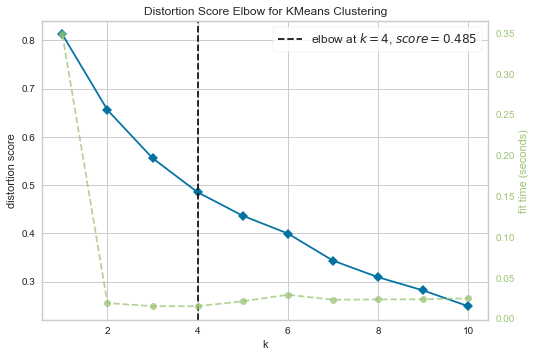

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [50]:
# K-means Clustering 

df_restaurant_clustering = df_restaurant_grouped.drop('Borough', 1) 
#Use a K-means Clustering algorithm from scikit-learn
model = KMeans()
# To find the optimal number of clusters, we use elbow' finding method 
visualiser = KElbowVisualizer(model, k=(1,11))
# visualise the data
visualiser.fit(df_restaurant_clustering)
visualiser.show()

In [51]:

cluster = AgglomerativeClustering(n_clusters=4, affinity='euclidean', linkage='ward')
cluster.fit_predict(df_restaurant_clustering)
print(cluster.labels_)
#df_restaurant_sorted.drop(['Cluster'], axis=1, inplace = True)
df_restaurant_sorted.insert(0, 'Cluster', cluster.labels_)
df_restaurant_sorted

[3 2 2 2 3 1 1 1 2 0 1 1 2 0 2 0 0 2 2 0 1 0 3 2 2 2 2 3]


,Cluster,Borough,1st most common,2nd most common,3rd most common,4th most common,5th most common
0,3,Barking and Dagenham,Fast Food Restaurant,Café,Fish and Chips Shop,Chinese Restaurant,Restaurant
1,2,Bexley,Chinese Restaurant,Fast Food Restaurant,Italian Restaurant,Café,Pub
2,2,Brent,Café,Pub,Fast Food Restaurant,Bakery,Fish and Chips Shop
3,2,Bromley,Café,Fast Food Restaurant,Pub,Indian Restaurant,Pizzeria
4,3,Camden,Fast Food Restaurant,Restaurant,Café,Fish and Chips Shop,Chinese Restaurant
5,1,Croydon,Restaurant,Café,Fast Food Restaurant,Fish and Chips Shop,Coffee Shop
6,1,Ealing,Restaurant,Fast Food Restaurant,Fish and Chips Shop,Indian Restaurant,Chinese Restaurant
7,1,Enfield,Café,Restaurant,Fast Food Restaurant,Bakery,Pizzeria
8,2,Greenwich,Café,Fast Food Restaurant,Pub,"Cafes, Coffee, and Tea Houses",Fish and Chips Shop
9,0,Hackney,Indian Restaurant,Fast Food Restaurant,Café,Asian Restaurant,Chinese Restaurant


In [52]:
# Based on the graph above, the optimal value of k is :
opt_k = 4

# implement the model using the optimal value of k
model = KMeans(n_clusters = opt_k)
model.fit(df_restaurant_clustering)
labels = model.labels_

df_restaurant_sorted.drop(['Cluster'], axis=1, inplace = True)
df_restaurant_sorted.insert(0, 'Cluster', labels)

In [53]:
# Cluster 0
print(df_restaurant_sorted.loc[df_restaurant_sorted['Cluster'] == 0, df_restaurant_sorted.columns[[1] + list(range(0, df_restaurant_sorted.shape[1]))]].shape)
df_restaurant_sorted.loc[df_restaurant_sorted['Cluster'] == 0, df_restaurant_sorted.columns[[1] + list(range(0, df_restaurant_sorted.shape[1]))]].head()


(5, 8)


,Borough,Cluster,Borough,1st most common,2nd most common,3rd most common,4th most common,5th most common
5,Croydon,0,Croydon,Restaurant,Café,Fast Food Restaurant,Fish and Chips Shop,Coffee Shop
6,Ealing,0,Ealing,Restaurant,Fast Food Restaurant,Fish and Chips Shop,Indian Restaurant,Chinese Restaurant
10,Hammersmith and Fulham,0,Hammersmith and Fulham,Restaurant,Fast Food Restaurant,Café,Night Club,Bakery
11,Haringey,0,Haringey,Restaurant,Chinese Restaurant,Café,Fast Food Restaurant,Fish and Chips Shop
20,Newham,0,Newham,Restaurant,Café,Chinese Restaurant,Fast Food Restaurant,Bar


In [54]:
# Let's examine each cluster to determine the discriminating venue categories that distinguish each cluster.
# Cluster 1
print(df_restaurant_sorted.loc[df_restaurant_sorted['Cluster'] == 1, df_restaurant_sorted.columns[[1] + list(range(0, df_restaurant_sorted.shape[1]))]].shape)
df_restaurant_sorted.loc[df_restaurant_sorted['Cluster'] == 1, df_restaurant_sorted.columns[[1] + list(range(0, df_restaurant_sorted.shape[1]))]].head()





(12, 8)


,Borough,Cluster,Borough,1st most common,2nd most common,3rd most common,4th most common,5th most common
1,Bexley,1,Bexley,Chinese Restaurant,Fast Food Restaurant,Italian Restaurant,Café,Pub
2,Brent,1,Brent,Café,Pub,Fast Food Restaurant,Bakery,Fish and Chips Shop
3,Bromley,1,Bromley,Café,Fast Food Restaurant,Pub,Indian Restaurant,Pizzeria
7,Enfield,1,Enfield,Café,Restaurant,Fast Food Restaurant,Bakery,Pizzeria
8,Greenwich,1,Greenwich,Café,Fast Food Restaurant,Pub,"Cafes, Coffee, and Tea Houses",Fish and Chips Shop


In [55]:
# Cluster 2
print(df_restaurant_sorted.loc[df_restaurant_sorted['Cluster'] == 2, df_restaurant_sorted.columns[[1] + list(range(0, df_restaurant_sorted.shape[1]))]].shape)
df_restaurant_sorted.loc[df_restaurant_sorted['Cluster'] == 2, df_restaurant_sorted.columns[[1] + list(range(0, df_restaurant_sorted.shape[1]))]].head()





(4, 8)


,Borough,Cluster,Borough,1st most common,2nd most common,3rd most common,4th most common,5th most common
9,Hackney,2,Hackney,Indian Restaurant,Fast Food Restaurant,Café,Asian Restaurant,Chinese Restaurant
15,Kensington and Chelsea,2,Kensington and Chelsea,Indian Restaurant,Fast Food Restaurant,Fish and Chips Shop,Café,Bar
16,Kingston upon Thames,2,Kingston upon Thames,Indian Restaurant,Fish and Chips Shop,English Restaurant,Restaurant,Fast Food Restaurant
17,Lambeth,2,Lambeth,Fast Food Restaurant,Fish and Chips Shop,Indian Restaurant,Café,Chinese Restaurant


In [56]:
# Cluster 3
print(df_restaurant_sorted.loc[df_restaurant_sorted['Cluster'] == 3, df_restaurant_sorted.columns[[1] + list(range(0, df_restaurant_sorted.shape[1]))]].shape)
df_restaurant_sorted.loc[df_restaurant_sorted['Cluster'] == 3, df_restaurant_sorted.columns[[1] + list(range(0, df_restaurant_sorted.shape[1]))]].head()




(7, 8)


,Borough,Cluster,Borough,1st most common,2nd most common,3rd most common,4th most common,5th most common
0,Barking and Dagenham,3,Barking and Dagenham,Fast Food Restaurant,Café,Fish and Chips Shop,Chinese Restaurant,Restaurant
4,Camden,3,Camden,Fast Food Restaurant,Restaurant,Café,Fish and Chips Shop,Chinese Restaurant
13,Hounslow,3,Hounslow,Fast Food Restaurant,Pizzeria,Restaurant,Indian Restaurant,Café
19,Merton,3,Merton,Fast Food Restaurant,Restaurant,Indian Restaurant,Café,Chinese Restaurant
21,Redbridge,3,Redbridge,Fast Food Restaurant,Indian Restaurant,Café,Turkish Restaurant,Bakery


In [57]:
# filter the result based on the borough value
df_restaurant_sorted[df_restaurant_sorted['Borough'] == 'Redbridge']


,Cluster,Borough,1st most common,2nd most common,3rd most common,4th most common,5th most common
21,3,Redbridge,Fast Food Restaurant,Indian Restaurant,Café,Turkish Restaurant,Bakery


<b>Conclusion:</b>


There're some issues we've faced, due to the limited data. We could drop the "Cafe"&"Restaurant" categories in order to enhance the clustering result. For example, in the Cluster 0, the 1st most common is Restaurant and in the Cluster 1, the 1st most common is Café.  

For Future work, we have to try to get more data by using the premium API or by webscarping instead of using the API. Another point is to creating an interactive dashboard, that allow users to filter and serach by the borough value. Further analysis could be done using this project as an initial point with adding more feature regarding the rent cost, tax, ...etc. 

